# Practical work 4: Frequency filtering, color

In [2]:
import numpy as np
from numpy.fft import fft2,ifft2,fftshift
import matplotlib.pyplot as plt
from PIL import Image
from math import sqrt

def imshow(I,title=None,size=500):
    """ display an image with a specific size """
    plt.figure(figsize=(size//80,size//80))
    plt.gray()
    plt.imshow(I)
    if title: plt.title(title)
    plt.show()

def computeFT(I):
    return np.fft.fft2(I)
    """ Array -> Array[complex] """

def toVisualizeFT(If):
    return np.fft.fftshift(np.abs(If))
    """ Array[complex] -> Array[float] """

def toVisualizeLogFT(If):
    return np.log(1+np.fft.fftshift(np.abs(If)))
    """ Array[complex] -> Array[float] """


## Exercice 1 - Frequency filtering

1. Compute than display the centered module of Fourier transform of `img/mandrill.png` (use functions seen in previous lessons). 

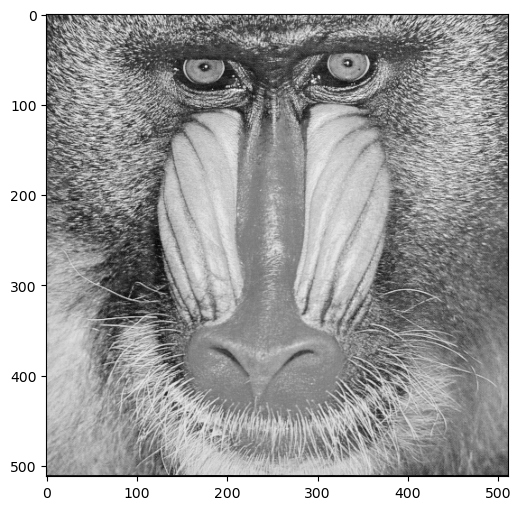

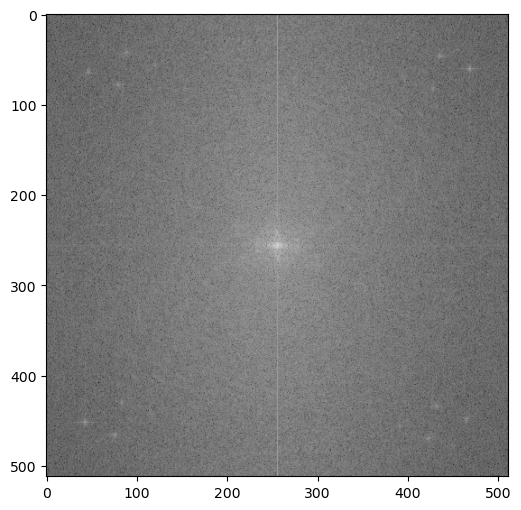

In [3]:
mandrill_img = np.array(Image.open('img/mandrill.png'))
mandrill_cm = toVisualizeLogFT(computeFT(mandrill_img))
imshow(mandrill_img)
imshow(mandrill_cm)

2. Write a function `idealLowPassFilter(n,m,fc)` returning an ideal low pass filter with frequency cutoff $f_c$ and size $n\times m$. Recall: this function set to 1 pixels at Euclidian distance $f_c$ from the center (null frequency).

In [4]:
def idealLowPassFilter(n, m, fc):
    ideallpf = np.zeros((n, m))
    centern = int(n / 2)
    centerm = int(m / 2)
    for i in range (n):
        for j in range (m):
            distancen = abs(i - centern)
            distancem = abs(j - centerm)
            if (sqrt(distancen**2 + distancem**2) <= (fc)):
                ideallpf[i][j] = 1
    return ideallpf

3. Write a function `lowPass(I,fc)` performing a low pass filtering of an image $I$. The function should
 - compute the centered Fourier transform of $I$
 - multiply point-by-point the spectrum with the ideal low filter produced by `idealLowPassFilter()`
 - uncenter the filtered spectrum and apply the inverse Fourier transform (use function `ifft2()` from module `numpy.fft`)
 - return the real part of filtered image

In [5]:
def lowPass(I, fc):
    cFT = fftshift(computeFT(I))
    n = I.shape[0]
    m = I.shape[1]
    ilpf = idealLowPassFilter(n, m, fc)
    filteredI = cFT * ilpf
    filteredI = fftshift(filteredI)
    filtered = ifft2(filteredI).real
    return filtered
    

4. Experiment this function on `img/mandrill.png` and `img/lena.jpg` with various values of cut off $f_c$.
 - give two effects that appears when $f_c$ decreases,
 - propose two applications of this filtering.


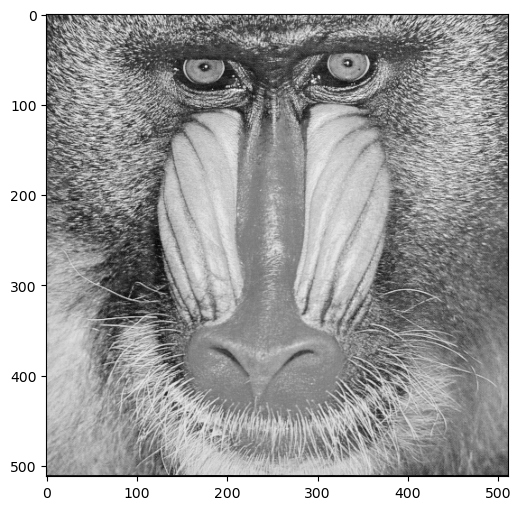

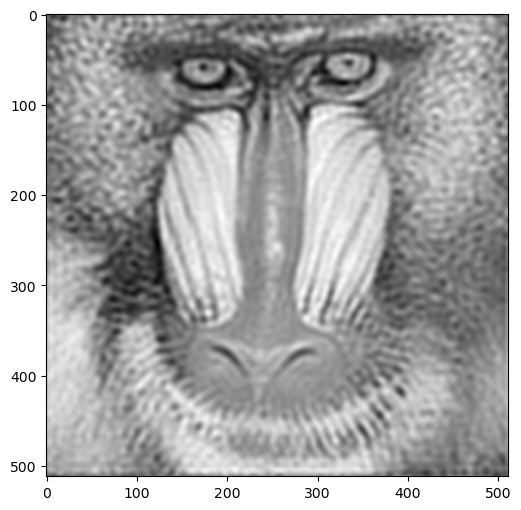

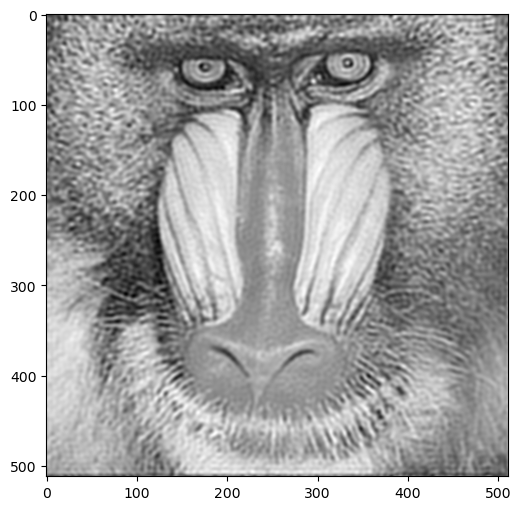

In [11]:
imshow(mandrill_img)
imshow(lowPass(mandrill_img, 50))
imshow(lowPass(mandrill_img, 80))

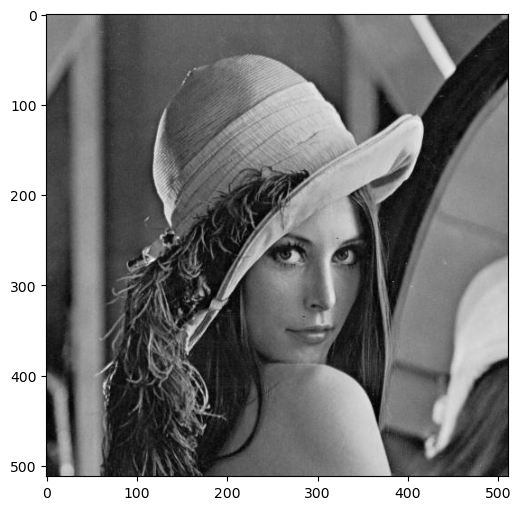

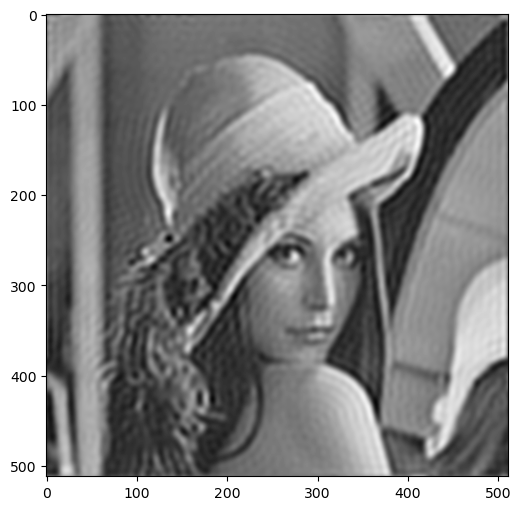

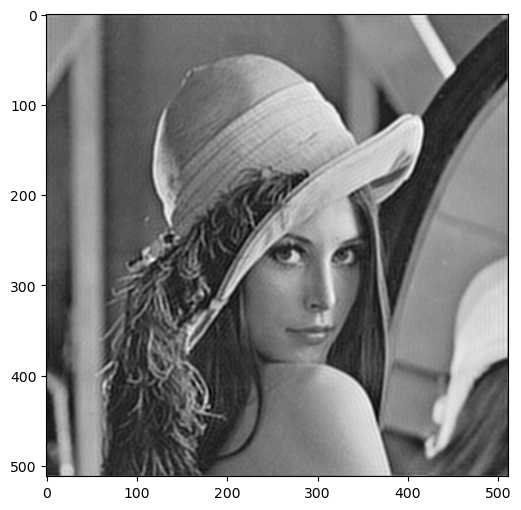

In [14]:
lena_img = np.array(Image.open('img/lena.jpg'))
imshow(lena_img)
imshow(lowPass(lena_img, 50))
imshow(lowPass(lena_img, 100))

In [9]:
2 applications are:
    1. blurring an image, i.e. a face, an object etc.
    2. smoothing an image, i.e. the background while leaving the rest of the image untouched.

SyntaxError: invalid syntax (1875150501.py, line 1)

## Exercice 2 -  Linear filtering (convolution)

1. Given a kernel convolution of size $d\times d$, $d$ being odd. How many lines and columns should be added to each side of the image to apply this filter? The image is supposed surrounded by zero values.

In [ ]:
If d is an odd number, the center pixel of the kernel is at (d/2, d/2).
To maintain the same image height after convolution, we need to add d/2 
rows to the top and d/2 rows to the bottom of the image. The same applies for the columns.

2. Write a function `imagePad(I,h)` getting an image and a kernel, returning a new image padded with zeros according to question 1. It is not allowed to use a module implementing the padding.

In [27]:
def imagePad(I, h):
    padding_size = int(h.shape[0] / 2)
    print(padding_size)
    h = I.shape[0] + padding_size * 2
    w = I.shape[1] + padding_size * 2  
    
    result = np.zeros((h,w))
    result[padding_size:h-padding_size, padding_size:w-padding_size] = I
    return  result

3. Write a function `conv2(I,h)` getting an image and a kernel and returning the convolution of $I$ by $h$. The function should return an image having the same shape than $I$. It is not allowed to use a module implementing the convolution.

In [28]:
def conv2d(I, h): 
    image_pad = imagePad(I,h)
    image_result = np.zeros(I.shape)
    
    for i in range( 0 , image_pad.shape[1] - h.shape[1] + 1):
        for j in range(0, image_pad.shape[0] - h.shape[0] + 1):
            mat_tmp = image_pad[i:i + h.shape[1], j:j + h.shape[0]]
            image_result[i,j] = np.sum(mat_tmp * h)
    return image_result

4. Try this function on mean filter of size $3\times3$, $5\times 5$ and $7\times 7$. Discuss the results.

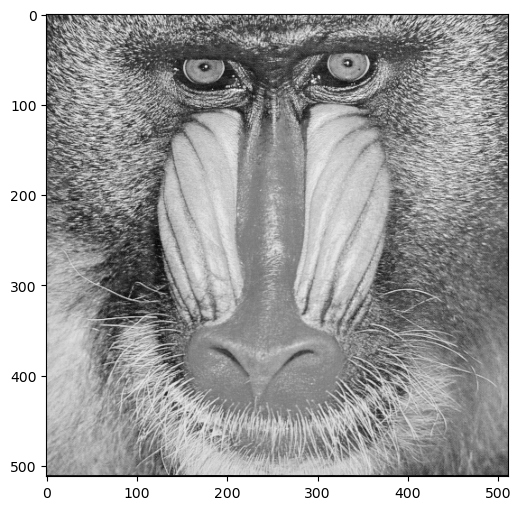

1


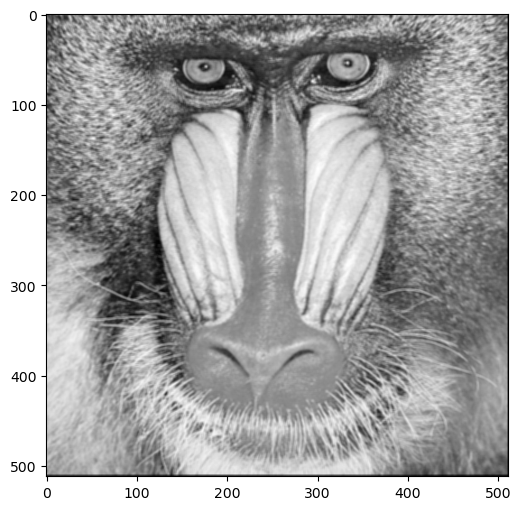

2


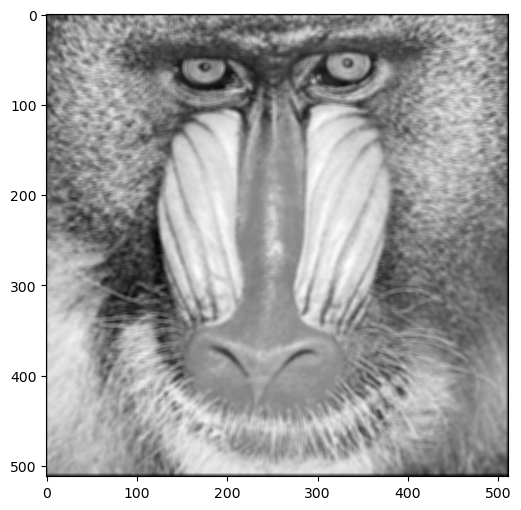

3


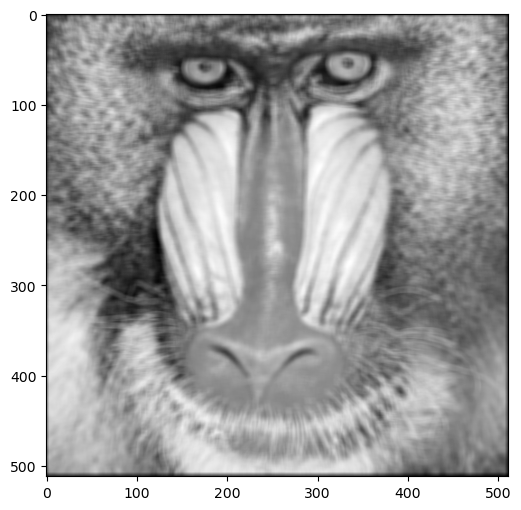

In [29]:
imshow(mandrill_img)

k = np.zeros((3,3))
k = k + 1
mf1 = conv2d(mandrill_img, k)
imshow(mf1)

k = np.zeros((5,5))
k = k + 1
mf2 = conv2d(mandrill_img, k)
imshow(mf2)

k = np.zeros((7,7))
k = k + 1
mf3 = conv2d(mandrill_img, k)
imshow(mf3)

5. Display the transfert function of these mean filters. For a better visualization, use the zero-padding technique to obtain a filter with a large size (for instance $256\times 256$). Use `imshow()` and `toVisualizeLogFT()`.

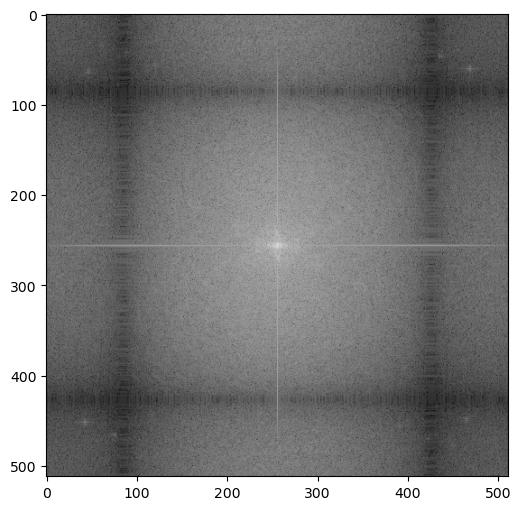

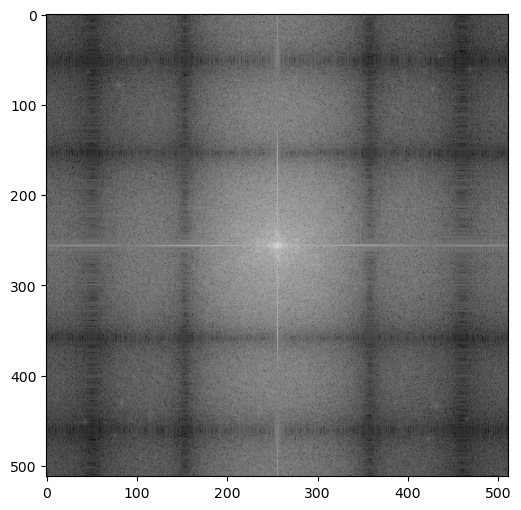

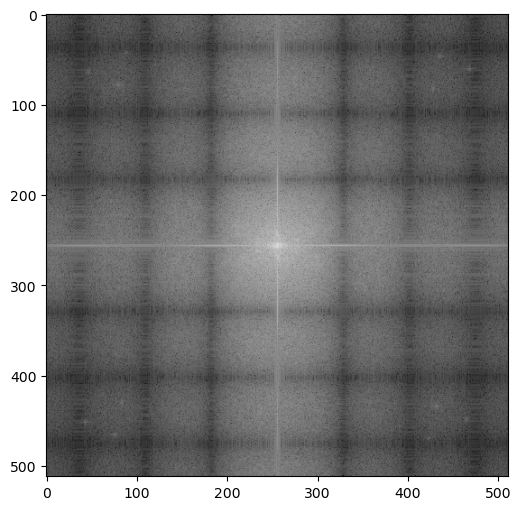

In [30]:
fft_mf1 = toVisualizeLogFT(computeFT(mf1))
imshow(fft_mf1)

fft_mf2 = toVisualizeLogFT(computeFT(mf2))
imshow(fft_mf2)

fft_mf3 = toVisualizeLogFT(computeFT(mf3))
imshow(fft_mf3)

6. Interpretation: what is the analytic expression of the transfert function of a mean filter? Is  it an ideal low pass filter?

In [ ]:
It is a 2d sinc. It is not ideal since its frequency support is not bounded.

7. Bonus question: perform the same study for the Gaussian kernel. Determine $\sigma$ in order to have filter of size $3\times3$, $5\times5$, and $7\times7$.

In [19]:
def gaussianKernel(sigma):
    """ double -> Array
        return a gaussian kernel of standard deviation sigma
    """
    n2 = int(np.ceil(3*sigma))
    x,y = np.meshgrid(np.arange(-n2,n2+1),np.arange(-n2,n2+1))
    kern = np.exp(-(x**2+y**2)/(2*sigma*sigma))
    return  kern/kern.sum()
### your answer start below


## Exercice 3: anti aliasing filtering

1. Give a code that subsamples of factor 2 (use function `subSample2()` given in TME3) the image `img/barbara.png`.

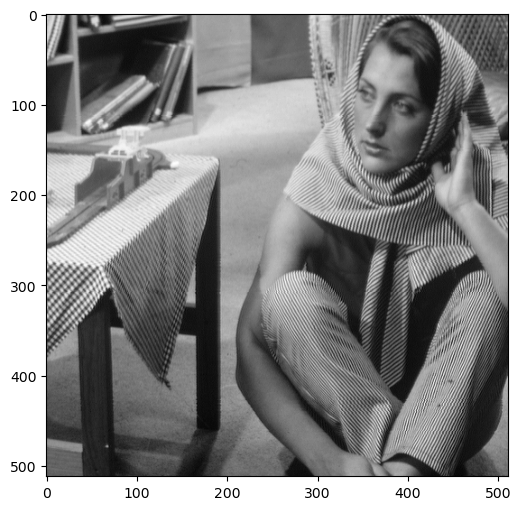

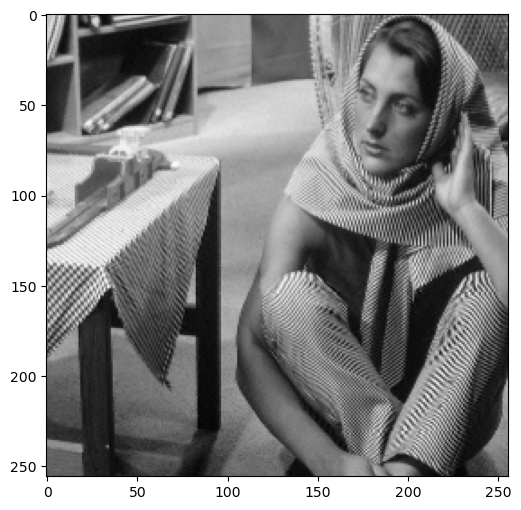

In [31]:
def subSample2(I):
    """ Array -> Array """
    return I[::2,::2]

barbara = np.array(Image.open('img/barbara.png'))
imshow(barbara)
barbaraSub2 = subSample2(barbara)
imshow(barbaraSub2)

2. Give a code that subsamples of factor 2 (use function `subSample2()`) the image `img/barbara.png` after applying an low pass filter (use `antiAliasingFilter()`). As comment, recall the principle of filtering in the frequency domain.

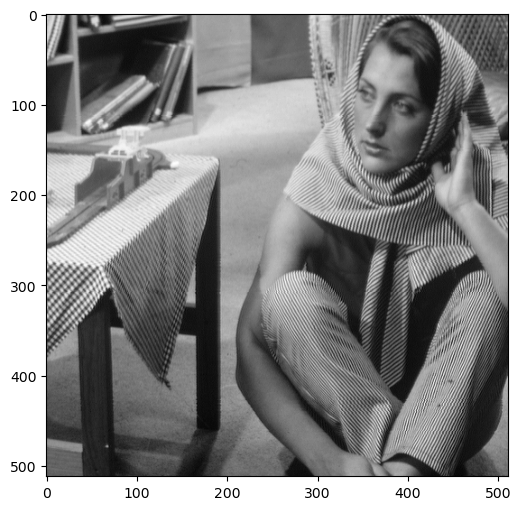

3


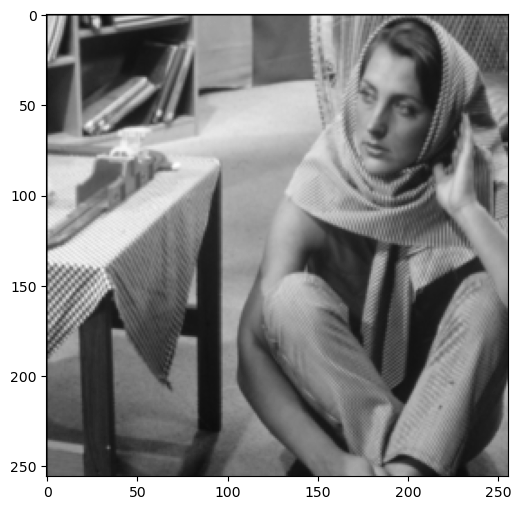

In [32]:
def antiAliasingFilter(n,m):
    """ int*int -> Array """
    n2, m2 = n//2, m//2
    rn, rm = n//4, m//4
    A = np.zeros((n, m))
    A[rn:rn+n2, rm:rm+m2] = 1
    return A
### your answer start below

imshow(barbara)
barbara3 = subSample2(conv2d(barbara, antiAliasingFilter(7,7)))
imshow(barbara3)

3. Describe and analyze the filtering of Barbara with and without the anti aliasing filter. What information is lost for the two filtered images ?

In [ ]:
When filtering the image with an anti-aliasing filter, we lose some high-frequency details, but we gain a more 
accurate representation with reduced aliasing artifacts. Without an anti-aliasing filter, we risk introducing 
aliasing artifacts and distortions, potentially leading to a less accurate representation of the original image.

## Exercice 4: color image
1. Read images `img/clown.bmp` and `img/clown_lumi.bmp` as two arrays named $I_1$ and $I_2$. Display these images examine their shape. What difference there are between them?

(512, 512, 3)


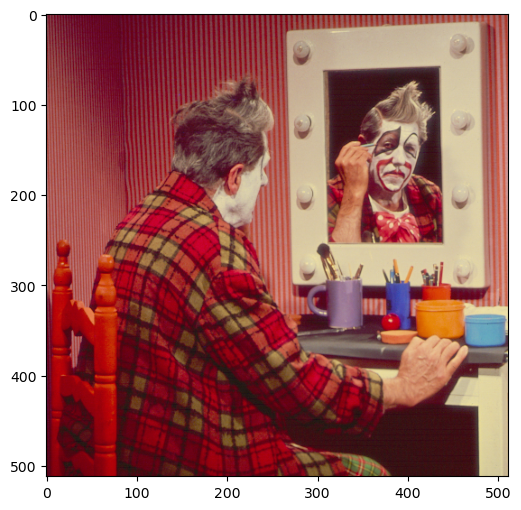

(512, 512)


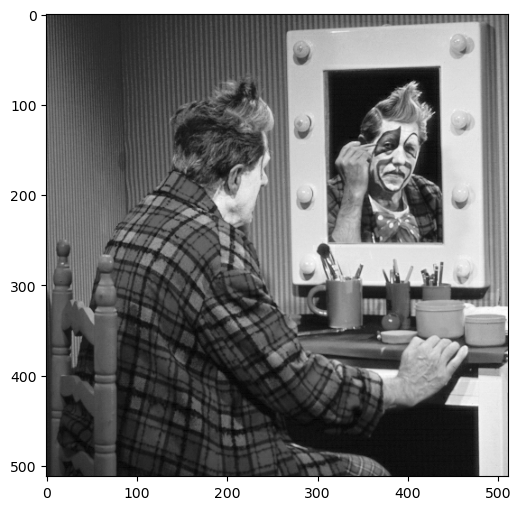

In [33]:
I1 = np.array(Image.open('img/clown.bmp'))
I2 = np.array(Image.open('img/clown_lumi.bmp'))
print(I1.shape)
imshow(I1)
print(I2.shape)
imshow(I2)

In [ ]:
The difference is that the colored image I1 has 3 values for each of the pixels corresponding to the color of 
the particular pixel. The black and white one just has one value for each pixel correspoding to the black/white value.

2. The first image is an array of dimension 3. Explain the signification of each dimension. From this image create 3 images $I_R$, $I_G$, $I_B$ of dimension 2. Display these three images and explain what you see.

In [ ]:
The first 2 dimensions are the number of pixels correspoding to the height and width of the image. The 3rd dimesion is the
value of RGB, correspoding to the color of the pixel and if it is red green or blue.

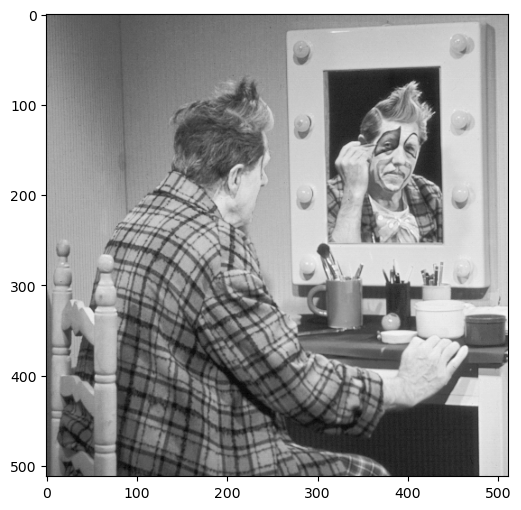

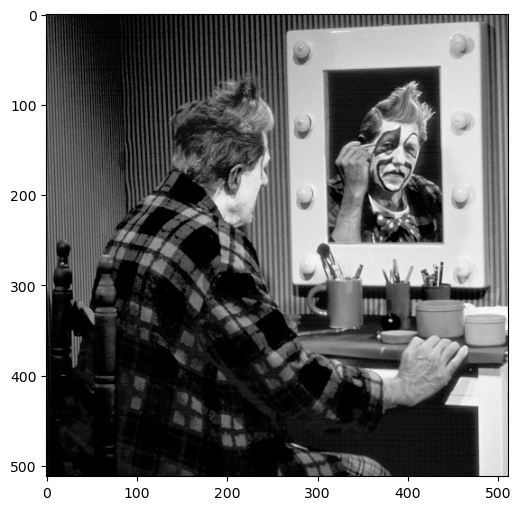

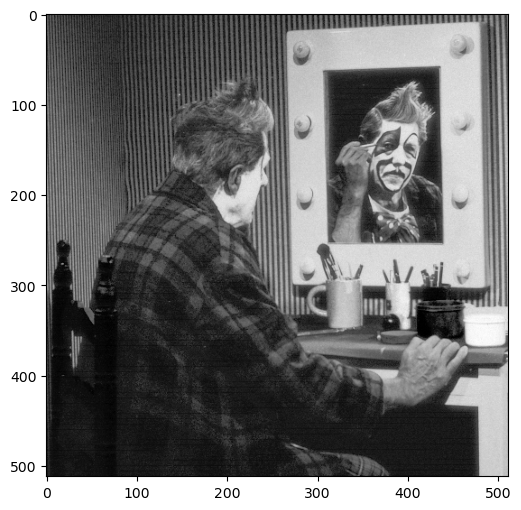

In [34]:
Ired = I1[:,:,0]
Igreen = I1[:,:,1]
Iblue = I1[:,:,2]
imshow(Ired)
imshow(Igreen)
imshow(Iblue)

In [ ]:
What we see here is 3 different images coming from the original image. Each image has colored the pixels 
that were colored red, green or blue in the original image. So one image is the red pixels, another is the
green and another is the blue.

3. Create a new image $I_3$ of dimensions 3, the first dimension contains the value of $I_R$, the second the value of $I_B$ and the third the values of $I_G$. Try another combinations. Remark: color images are better handled by `imshow()` if pixel values range in $[0,1]$.

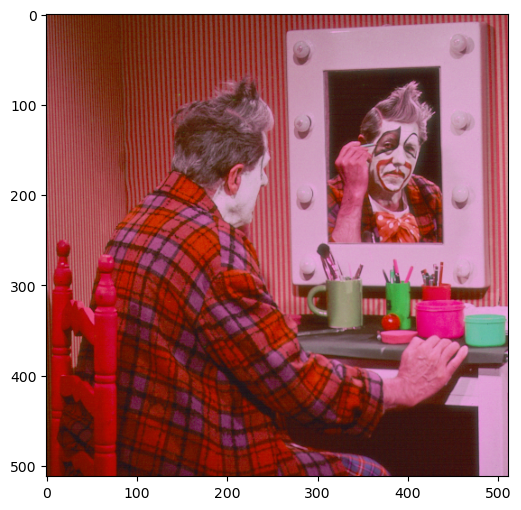

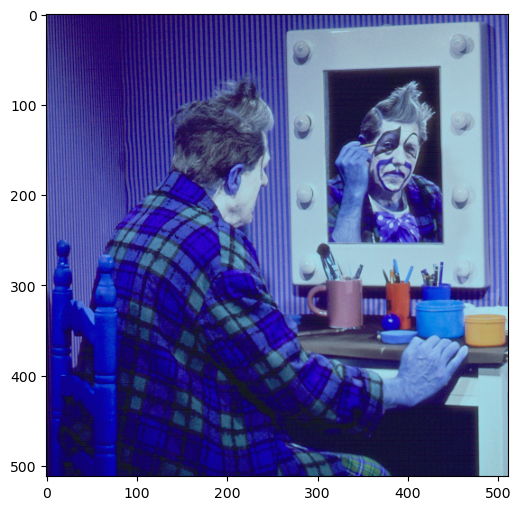

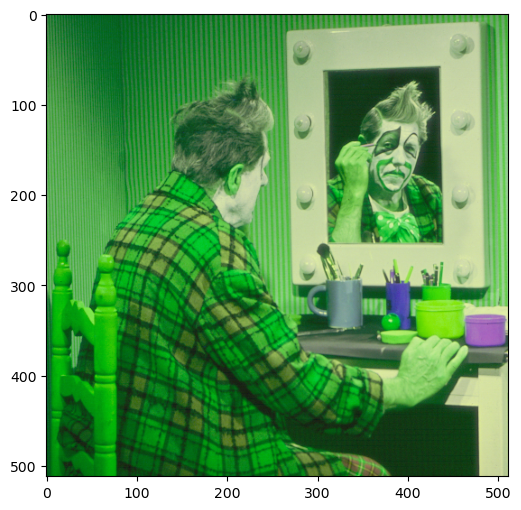

In [35]:
Ired2 = np.expand_dims(Ired, axis=2)
Igreen2 = np.expand_dims(Igreen, axis=2)
Iblue2 = np.expand_dims(Iblue, axis=2)

I3 = np.concatenate((np.concatenate((Ired2, Iblue2), axis=2), Igreen2), axis=2)/255
imshow(I3)

I3=np.concatenate((np.concatenate((Iblue2, Igreen2), axis=2), Ired2), axis=2)/255
imshow(I3)

I3=np.concatenate((np.concatenate((Igreen2, Ired2), axis=2), Iblue2), axis=2)/255
imshow(I3)

4. Write a code that allows the see the first channel with red color scales, the second channel in green color scales, and the blue channel in blue color scales.

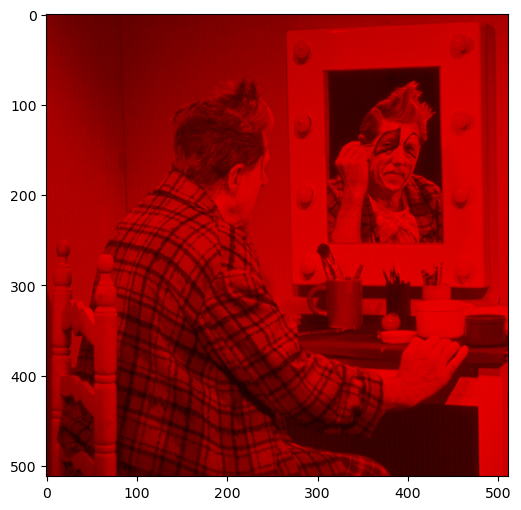

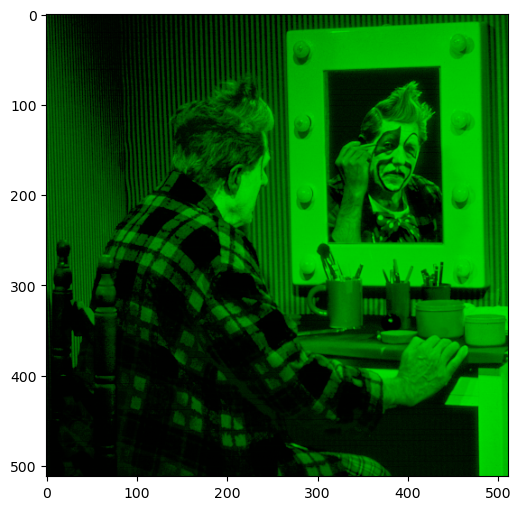

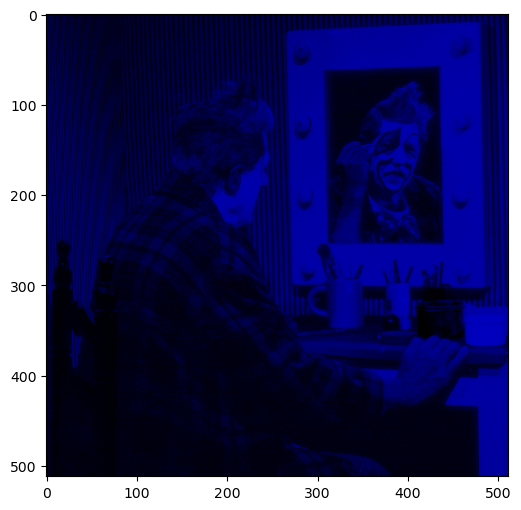

In [36]:
# start with a blank image and decide on the values of each color for each image
zeros = np.expand_dims(np.zeros((512, 512)), axis=2)
IredInRedImage = np.concatenate((np.concatenate((Ired2, zeros), axis=2), zeros), axis=2) / 255
IgreenInGreenImage = np.concatenate((np.concatenate((zeros, Igreen2), axis=2), zeros), axis=2) / 255
IblueInBlueImage = np.concatenate((np.concatenate((zeros, zeros), axis=2), Iblue2), axis=2) / 255

# show the 3 images
imshow(IredInRedImage)
imshow(IgreenInGreenImage)
imshow(IblueInBlueImage)